In [1]:
import pandas as pd       # For data manipulation
import numpy as np        # For numerical computations
import matplotlib.pyplot as plt  # For plotting
import seaborn as sns     # For advanced visualizations
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
# Optional: Setting up plot style for consistency
plt.style.use('seaborn-darkgrid')
from IPython.display import display, HTML
from sklearn.tree import DecisionTreeRegressor
import math
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score

C:\Users\rahul\AppData\Local\Temp\ipykernel_10232\1096662761.py:12: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


In [2]:
df = pd.read_csv(r'C:\Users\rahul\Desktop\Work\New_Projects\Banking_Finance\Global_Inflation\global_inflation_data.csv', header=0)

# Display the first few rows to understand the data structure
df.head()

,country_name,indicator_name,1980,1981,1982,1983,1984,1985,1986,1987,...,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,Afghanistan,Annual average inflation (consumer prices) rate,13.4,22.2,18.2,15.9,20.4,8.7,-2.1,18.4,...,-0.66,4.38,4.98,0.63,2.3,5.44,5.06,13.71,9.1,NaN
1,Albania,Annual average inflation (consumer prices) rate,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.90,1.30,2.00,2.00,1.4,1.60,2.00,6.70,4.8,4.0
2,Algeria,Annual average inflation (consumer prices) rate,9.7,14.6,6.6,7.8,6.3,10.4,14.0,5.9,...,4.80,6.40,5.60,4.30,2.0,2.40,7.20,9.30,9.0,6.8
3,Andorra,Annual average inflation (consumer prices) rate,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-1.10,-0.40,2.60,1.00,0.5,0.10,1.70,6.20,5.2,3.5
4,Angola,Annual average inflation (consumer prices) rate,46.7,1.4,1.8,1.8,1.8,1.8,1.8,1.8,...,9.20,30.70,29.80,19.60,17.1,22.30,25.80,21.40,13.1,22.3


In [3]:
# Display basic information about the dataset
print("Dataset Info:")
df.info()


Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 196 entries, 0 to 195
Data columns (total 47 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   country_name    196 non-null    object 
 1   indicator_name  196 non-null    object 
 2   1980            140 non-null    float64
 3   1981            144 non-null    float64
 4   1982            145 non-null    float64
 5   1983            145 non-null    float64
 6   1984            145 non-null    float64
 7   1985            145 non-null    float64
 8   1986            145 non-null    float64
 9   1987            147 non-null    float64
 10  1988            147 non-null    float64
 11  1989            147 non-null    float64
 12  1990            150 non-null    float64
 13  1991            155 non-null    float64
 14  1992            158 non-null    float64
 15  1993            169 non-null    float64
 16  1994            171 non-null    float64
 17  1995            172 n

In [4]:
# Display basic statistical summary of the dataset
print("\nDataset Summary:")
df.describe()


Dataset Summary:


,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,...,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
count,140.000000,144.000000,145.000000,145.000000,145.000000,145.000000,145.000000,147.000000,147.000000,147.000000,...,194.000000,194.000000,195.000000,195.000000,195.000000,194.000000,194.000000,194.000000,192.000000,191.000000
mean,21.757143,17.796528,17.029655,19.177241,26.979310,103.215172,25.262069,111.294558,58.635374,101.246259,...,4.116186,6.594742,7.656821,339.688359,107.294872,19.832680,16.577629,13.616031,13.736458,9.309424
std,33.656118,18.992691,22.797064,34.806824,111.889811,975.748316,86.931210,1081.094434,400.370989,679.792142,...,10.763149,31.096216,34.954954,4681.227548,1425.256254,173.722612,117.154632,25.282229,39.667874,25.195589
min,-7.300000,0.000000,-0.900000,-8.500000,-7.400000,-16.000000,-17.600000,-31.200000,-13.000000,-9.600000,...,-3.800000,-5.600000,-13.300000,-44.400000,-3.200000,-2.600000,-3.000000,-3.200000,-0.800000,1.200000
25%,9.550000,8.600000,6.100000,5.000000,3.800000,2.800000,1.800000,2.150000,2.550000,3.350000,...,0.100000,0.100000,1.150000,1.300000,0.800000,0.400000,1.925000,5.500000,4.000000,2.800000
50%,13.850000,12.500000,10.300000,8.700000,8.000000,7.100000,5.800000,5.900000,6.800000,6.900000,...,1.500000,1.500000,2.400000,2.500000,2.200000,1.900000,3.500000,8.100000,5.800000,4.000000
75%,20.525000,19.800000,16.700000,16.000000,17.100000,16.800000,18.200000,16.650000,17.800000,16.700000,...,4.800000,5.125000,5.200000,4.300000,4.000000,4.575000,5.975000,11.975000,9.925000,5.800000
max,316.600000,116.800000,123.600000,275.600000,1281.300000,11749.600000,885.200000,13109.500000,4775.200000,7428.700000,...,121.700000,346.100000,438.100000,65374.100000,19906.000000,2355.100000,1588.500000,193.400000,360.000000,222.400000


In [5]:
# Initial observations (to help guide insights)
print("\nNumber of countries:", df['country_name'].nunique())
print("Number of years covered:", len(df.columns) - 2)  # Excluding 'country_name' and 'indicator_name'


Number of countries: 196
Number of years covered: 45


Missing Values in Each Column:
1980    56
1981    52
1982    51
1983    51
1984    51
1985    51
1986    51
1987    49
1988    49
1989    49
1990    46
1991    41
1992    38
1993    27
1994    25
1995    24
1996    20
1997    17
1998    15
1999    14
2000    13
2001     9
2002     7
2003     6
2004     5
2005     3
2006     3
2007     3
2008     3
2009     3
2010     3
2011     4
2012     3
2013     2
2014     2
2015     2
2016     2
2017     1
2018     1
2019     1
2020     2
2021     2
2022     2
2023     4
2024     5
dtype: int64


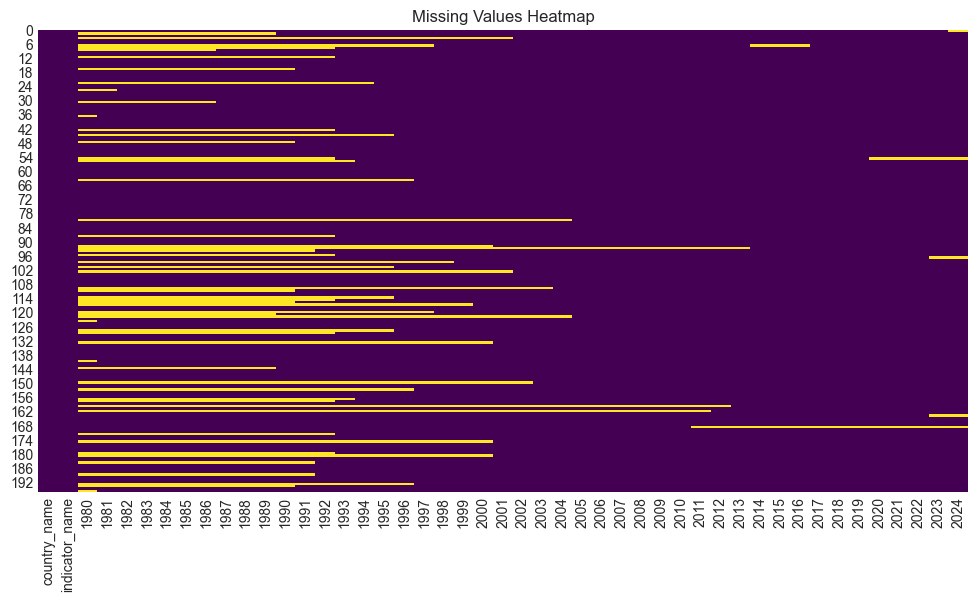

In [6]:
# Checking for missing values
missing_values = df.isnull().sum()
print("Missing Values in Each Column:")
print(missing_values[missing_values > 0])

# Visualizing missing values across the dataset
plt.figure(figsize=(12, 6))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
plt.title("Missing Values Heatmap")
plt.show()

In [7]:
# Calculating percentage of missing data for each country
missing_data_per_country = df.isnull().mean(axis=1) * 100
print("Countries with More Than 20% Missing Data:")
print(df['country_name'][missing_data_per_country > 20].unique())

Countries with More Than 20% Missing Data:
['Albania' 'Andorra' 'Argentina' 'Armenia' 'Azerbaijan' 'Belarus'
 'Bosnia and Herzegovina' 'Croatia' 'Czech Republic' 'Djibouti' 'Eritrea'
 'Estonia' 'Georgia' 'Iraq' 'Kazakhstan' 'Kosovo' 'Kuwait'
 'Kyrgyz Republic' 'Latvia' 'Liberia' 'Lithuania' 'Macao SAR'
 'Marshall Islands' 'Mauritania' 'Micronesia, Fed. States of' 'Moldova'
 'Mongolia' 'Montenegro' 'Myanmar' 'Namibia' 'Nauru' 'Nigeria'
 'North Macedonia ' 'Palau' 'Russian Federation' 'San Marino' 'Serbia'
 'Slovak Republic' 'Slovenia' 'Somalia' 'South Sudan, Republic of' 'Syria'
 'Tajikistan' 'Timor-Leste' 'Turkmenistan' 'Tuvalu' 'Ukraine' 'Uzbekistan'
 'West Bank and Gaza' 'Yemen']


In [8]:
 
df = df.fillna(df.median(numeric_only=True))

# Verifying no missing values remain
print("Missing Values After Imputation:")
print(df.isnull().sum().sum())

Missing Values After Imputation:
0


In [9]:
def plot_inflation_graphs(df, num_graphs):
    # Ensure the number of graphs does not exceed the number of countries in the DataFrame
    num_countries = min(num_graphs, df.shape[0])

    # Setup the subplot grid
    ncols = 2  # Number of columns in the subplot grid
    nrows = int(num_countries / ncols) + (num_countries % ncols > 0)  # Calculate rows needed

    fig, axs = plt.subplots(nrows, ncols, figsize=(15, nrows * 4))
    fig.subplots_adjust(hspace=0.4, wspace=0.4)  # Adjust spacing between plots
    
    for i in range(num_countries):
        row = i // ncols
        col = i % ncols
        
        # Select data for the current country
        country_data = df.iloc[i, 2:]  # Exclude country_name and indicator columns
        years = country_data.index.astype(int)
        
        # Ensure the data is numeric and replace non-numeric values with NaN
        values = pd.to_numeric(country_data.values, errors='coerce')
        
        # Cap values at 120 for those greater than 100
        modified_values = np.where(values > 100, 120, values)
        
        # Plotting on the respective subplot
        ax = axs[row, col] if nrows > 1 else axs[col] if nrows == 1 else axs
        ax.plot(years, modified_values, marker='o', linestyle='-')
        ax.set_title(df.iloc[i, 0])
        ax.set_xlabel("Year")
        ax.set_ylabel("Inflation")
        ax.grid(True)
        ax.tick_params(labelrotation=45)
        
        # Adjust y-ticks to exclude values beyond the cap
        y_ticks = ax.get_yticks()
        y_ticks = y_ticks[y_ticks <= 120]  # Keep y-ticks up to and including the cap
        y_tick_labels = [f"{y:.0f}" if y < 120 else "100+" for y in y_ticks]
        ax.set_yticks(y_ticks)
        ax.set_yticklabels(y_tick_labels)

    # If the number of countries is odd, hide the last subplot if it's unused
    if num_countries % ncols:
        axs[-1, -1].axis('off')

    plt.tight_layout()
    plt.show()

    


In [10]:
def find_high_inflation_countries(df):
    high_inflation_countries = {}  # Dictionary to store results
    
    # Exclude non-numeric columns (e.g., country names) from the comparison
    numeric_df = df.select_dtypes(include=[np.number])
    
    for index, row in numeric_df.iterrows():
        country_name = df.loc[index, 'country_name']  # Get the country name from the original DataFrame
        high_inflation_years = row[row > 100].index.tolist()  # Now, this comparison is safe
        
        if high_inflation_years:
            # Assuming years are direct column names, adjust if needed
            high_inflation_countries[country_name] = high_inflation_years

    return high_inflation_countries



In [11]:
def display_side_by_side(df, columns):    
    # Convert the input data into a DataFrame if it's not already one
    results_df = pd.DataFrame(list(df.items()), columns=columns)
    
    # Split the DataFrame into two halves
    midpoint = len(results_df) // 2
    left_df = results_df.iloc[:midpoint]
    right_df = results_df.iloc[midpoint:]
    
    # Convert both halves to HTML
    left_html = left_df.to_html(index=False)
    right_html = right_df.to_html(index=False)
    
    # Add styling to headers in both halves
    left_html = left_html.replace('<th>', '<th style="font-weight: bold; text-decoration: underline;">')
    right_html = right_html.replace('<th>', '<th style="font-weight: bold; text-decoration: underline;">')
    
    # Combine the two halves into a single HTML structure, using divs for side-by-side display
    combined_html = f'''
    <div style="display: flex; justify-content: space-between;">
        <div style="width: 49%; margin-right: 1%;">{left_html}</div>
        <div style="width: 49%; margin-left: 1%;">{right_html}</div>
    </div>
    '''
    
    # Display the combined HTML
    display(HTML(combined_html))



In [12]:
def find_negative_inflation_countries(df):
    negative_inflation_countries = {}  # Dictionary to store results
    
    # Exclude non-numeric columns (e.g., country names) from the comparison
    numeric_df = df.select_dtypes(include=[np.number])
    
    for index, row in numeric_df.iterrows():
        country_name = df.loc[index, 'country_name']  # Get the country name from the original DataFrame
        high_inflation_years = row[row < 0].index.tolist()  # Now, this comparison is safe
        
        if high_inflation_years:
            # Assuming years are direct column names, adjust if needed
            negative_inflation_countries[country_name] = high_inflation_years

    return negative_inflation_countries



In [13]:
def filter_leading_economies_and_plot_correlation(df_copy):
    df_copy.drop('indicator_name', axis=1, inplace=True)
    df_copy.set_index('country_name', inplace=True)
    df_transposed = df_copy.T
    countries = [
        "United States", "China", "Japan", "Germany", "India",
        "United Kingdom", "France", "Italy", "Canada", "Brazil"
    ]
    df_filtered = df_transposed[countries]
    corr = df_filtered.corr()
    plt.figure(figsize=(10, 8))
    sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm', cbar=True)
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=45)
    plt.title('Correlation Matrix of Top 10 GDP countries')
    plt.show()

In [14]:
high_inflation_countries = find_high_inflation_countries(df)
display_side_by_side(high_inflation_countries, ['Country', 'Years with Inflation > 100'])


Country,Years with Inflation > 100
Albania,[1992]
Angola,"[1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002]"
Argentina,[2023]
Armenia,"[1993, 1994, 1995]"
Azerbaijan,"[1993, 1994, 1995]"
Belarus,"[1992, 1993, 1994, 1995, 1999, 2000]"
Bolivia,"[1982, 1983, 1984, 1985, 1986]"
Brazil,"[1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994]"
Bulgaria,"[1991, 1996, 1997]"
Cambodia,"[1990, 1991, 1993]"


In [15]:
negative_inflation_countries = find_negative_inflation_countries(df)
display_side_by_side(negative_inflation_countries, ['Country', 'Years with Negative Inflation'])


Country,Years with Negative Inflation
Afghanistan,"[1986, 2001, 2009, 2015]"
Albania,[1990]
Andorra,"[2009, 2014, 2015, 2016]"
Antigua and Barbuda,"[2000, 2009, 2016]"
Argentina,"[1999, 2000, 2001]"
Armenia,"[2000, 2016]"
Aruba,"[2009, 2013, 2016, 2017, 2020]"
Azerbaijan,"[1998, 1999]"
"Bahamas, The",[2016]
Bahrain,"[1985, 1986, 1987, 1992, 1996, 1998, 1999, 2000, 2001, 2002, 2011, 2020, 2021]"


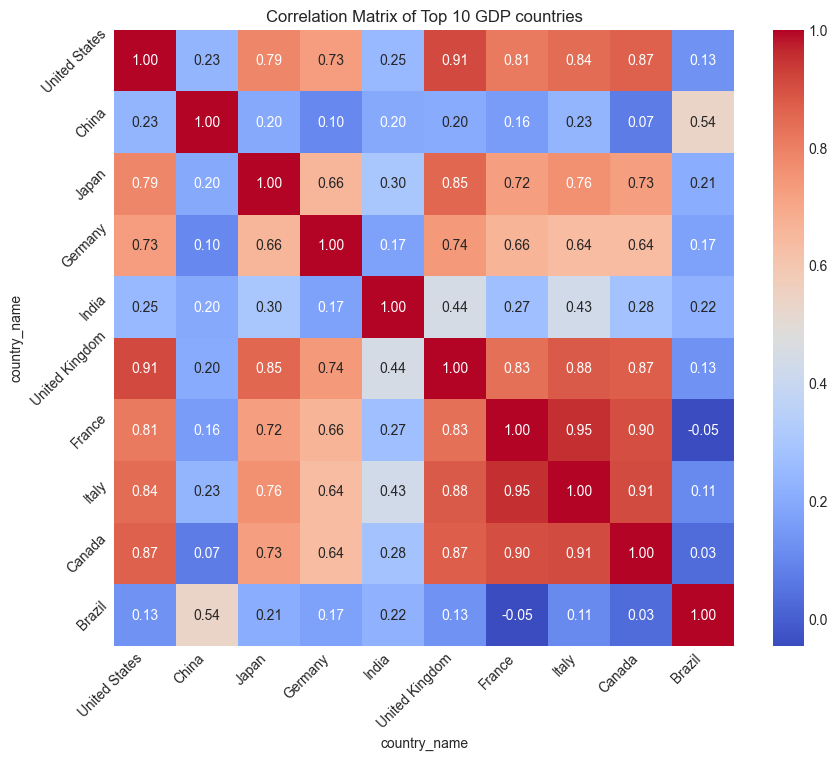

In [16]:
df_copy = df.copy(deep=True)
filter_leading_economies_and_plot_correlation(df_copy)

In [17]:
plot_inflation_graphs(df, num_graphs=197) 


In [18]:
years = df.columns[2:]  # Get the year columns dynamically
countries = df['country_name'].unique()

In [19]:
# Define grid layout
n_cols = 3
n_rows = int(np.ceil(len(countries) / n_cols))

In [20]:
continents = {
    "Asia": ["Afghanistan", "Armenia", "Azerbaijan", "Bahrain", "Bangladesh", "Bhutan", "Brunei Darussalam", "China, People's Republic of", "Georgia", "India", "Indonesia", "Iran", "Iraq", "Israel", "Japan", "Jordan", "Kazakhstan", "Kuwait", "Kyrgyz Republic", "Lebanon", "Malaysia", "Maldives", "Mongolia", "Myanmar", "Nepal", "Oman", "Pakistan", "Philippines", "Qatar", "Saudi Arabia", "Singapore", "South Korea", "Sri Lanka", "Syria", "Taiwan Province of China", "Tajikistan", "Thailand", "Turkmenistan", "United Arab Emirates", "Uzbekistan", "Vietnam", "Yemen"],
    "Europe": ["Albania", "Andorra", "Austria", "Belarus", "Belgium", "Bosnia and Herzegovina", "Bulgaria", "Croatia", "Cyprus", "Czech Republic", "Denmark", "Estonia", "Finland", "France", "Germany", "Greece", "Hungary", "Iceland", "Ireland", "Italy", "Latvia", "Lithuania", "Luxembourg", "Malta", "Moldova", "Monaco", "Montenegro", "Netherlands", "North Macedonia", "Norway", "Poland", "Portugal", "Romania", "Russia", "San Marino", "Serbia", "Slovakia", "Slovenia", "Spain", "Sweden", "Switzerland", "Ukraine", "United Kingdom"],
    "Africa": ["Algeria", "Angola", "Benin", "Botswana", "Burkina Faso", "Burundi", "Cabo Verde", "Cameroon", "Central African Republic", "Chad", "Comoros", "Congo, Dem. Rep.", "Congo, Republic of", "Cote d'Ivoire", "Djibouti", "Egypt", "Equatorial Guinea", "Eritrea", "Eswatini", "Ethiopia", "Gabon", "Gambia", "Ghana", "Guinea", "Guinea-Bissau", "Kenya", "Lesotho", "Liberia", "Madagascar", "Malawi", "Mali", "Mauritania", "Mauritius", "Morocco", "Mozambique", "Namibia", "Niger", "Nigeria", "Rwanda", "Sao Tome and Principe", "Senegal", "Seychelles", "Sierra Leone", "South Africa", "South Sudan", "Sudan", "Tanzania", "Togo", "Tunisia", "Uganda", "Zambia", "Zimbabwe"],
    "North America": ["Antigua and Barbuda", "Bahamas, The", "Barbados", "Belize", "Canada", "Costa Rica", "Cuba", "Dominica", "Dominican Republic", "El Salvador", "Grenada", "Guatemala", "Haiti", "Honduras", "Jamaica", "Mexico", "Nicaragua", "Panama", "Saint Kitts and Nevis", "Saint Lucia", "Saint Vincent and the Grenadines", "Trinidad and Tobago", "United States"],
    "South America": ["Argentina", "Bolivia", "Brazil", "Chile", "Colombia", "Ecuador", "Guyana", "Paraguay", "Peru", "Suriname", "Uruguay", "Venezuela"],
    "Australia": ["Australia", "Fiji", "Kiribati", "Marshall Islands", "Micronesia", "Nauru", "New Zealand", "Palau", "Papua New Guinea", "Samoa", "Solomon Islands", "Tonga", "Tuvalu", "Vanuatu"],
    "Antarctica": []  # Assuming there are no countries with inflation data here
}

In [21]:
years = df.columns[2:].astype(int)

def plot_continent_inflation_trends(continent_name):
    # Get countries for the specified continent
    countries = continents.get(continent_name, [])
    
    # Filter data for selected countries
    continent_data = df[df['country_name'].isin(countries)]
    
    # Set up the plot grid (3 countries per row)
    num_countries = len(countries)
    num_cols = 3
    num_rows = (num_countries + num_cols - 1) // num_cols

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 3))
    axes = axes.flatten()  # Flatten for easy iteration

    for i, country in enumerate(countries):
        # Plot only if the country data is available
        if country in continent_data['country_name'].values:
            country_data = continent_data[continent_data['country_name'] == country].iloc[0, 2:]
            ax = axes[i]
            ax.plot(years, country_data, label=country)
            
            # Mark spikes
            diffs = np.diff(country_data)
            spike_indices = np.where(diffs > 20)[0] + 1  # Adjust threshold as needed
            ax.plot(years[spike_indices], country_data.iloc[spike_indices], 'ro')  # Red dots for spikes

            ax.set_title(country)
            ax.set_xlabel("Year")
            ax.set_ylabel("Inflation Rate")
            ax.legend()
        else:
            # Hide empty subplot if no country data
            axes[i].axis('off')
    
    # Hide any extra subplots if there are fewer than num_rows * num_cols countries
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')
    
    plt.tight_layout()
    plt.suptitle(f"Inflation Trends for {continent_name}", y=1.05, fontsize=16)
    plt.show()

 


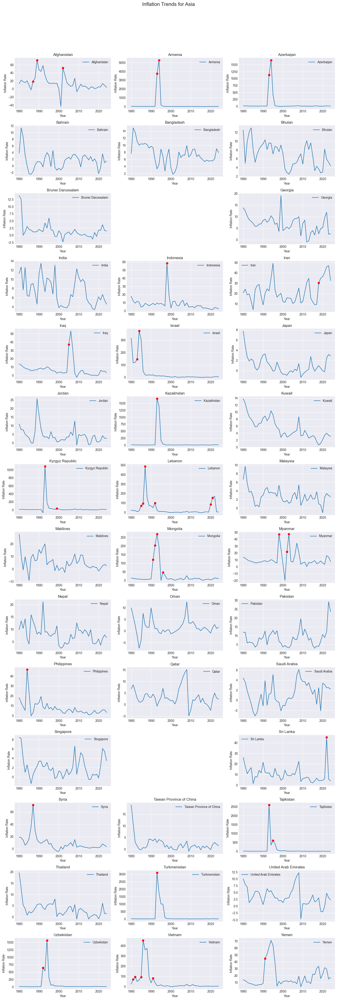

In [22]:
plot_continent_inflation_trends("Asia")

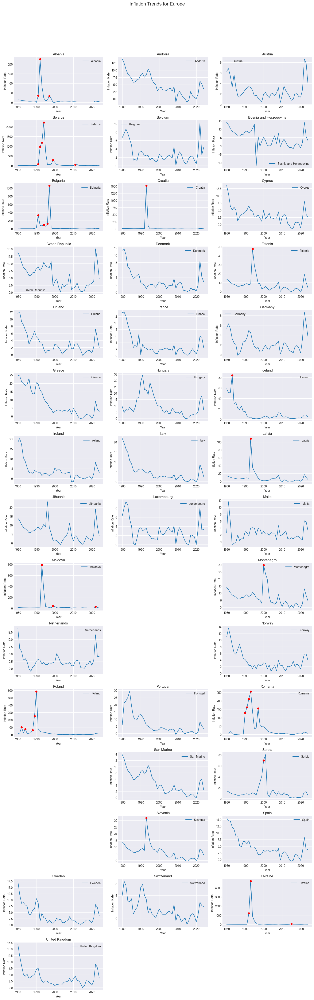

In [23]:
plot_continent_inflation_trends("Europe")

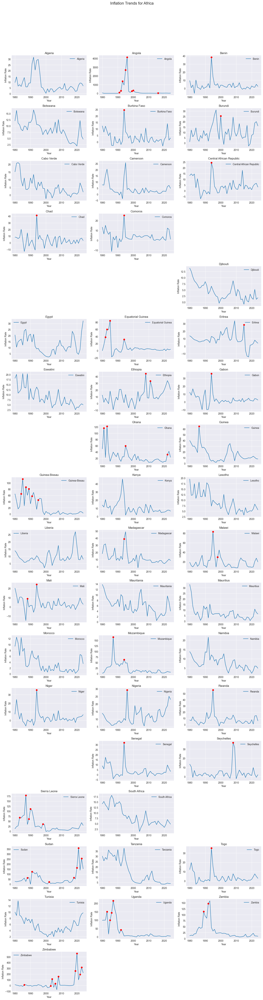

In [24]:
plot_continent_inflation_trends("Africa")

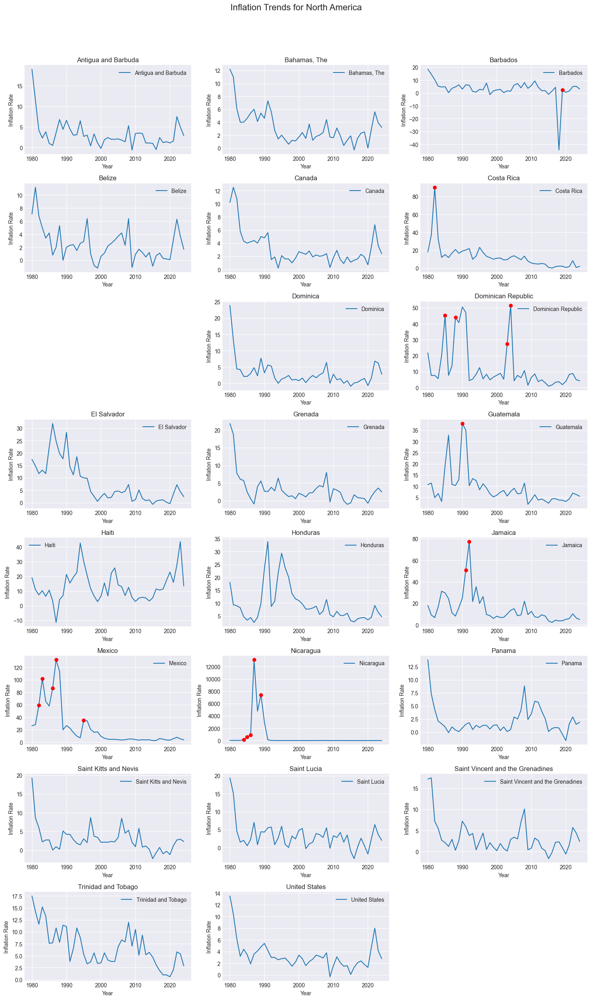

In [25]:
plot_continent_inflation_trends("North America")

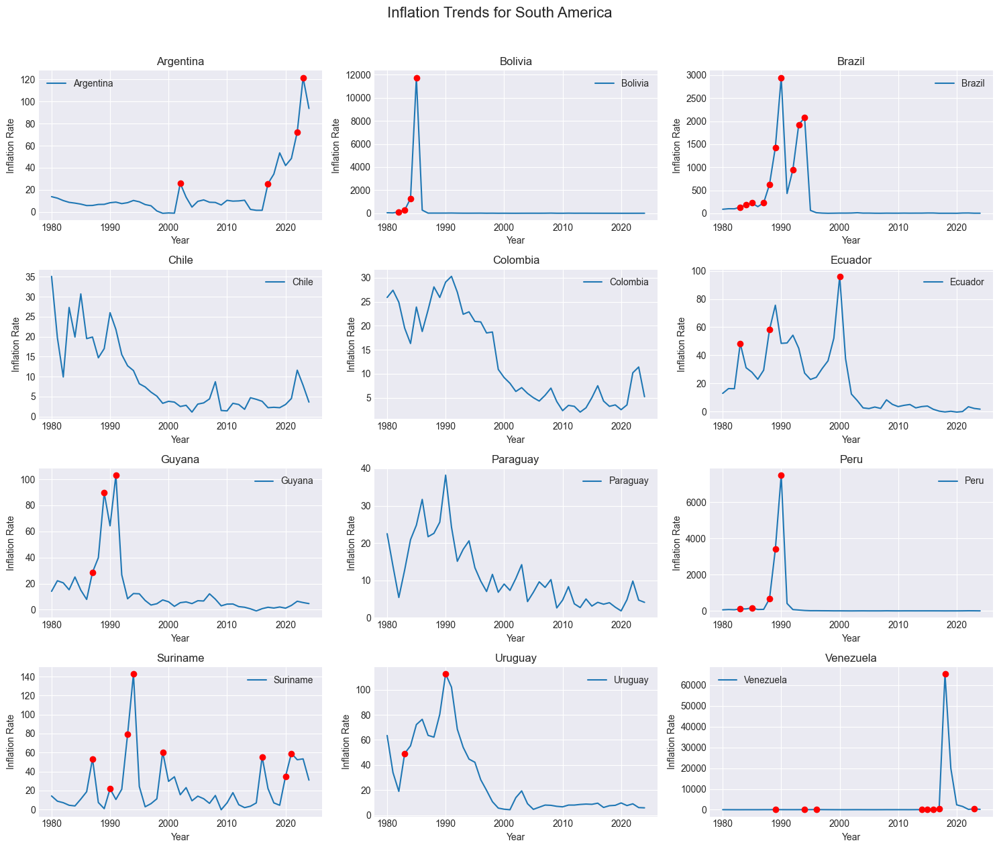

In [26]:
plot_continent_inflation_trends("South America")

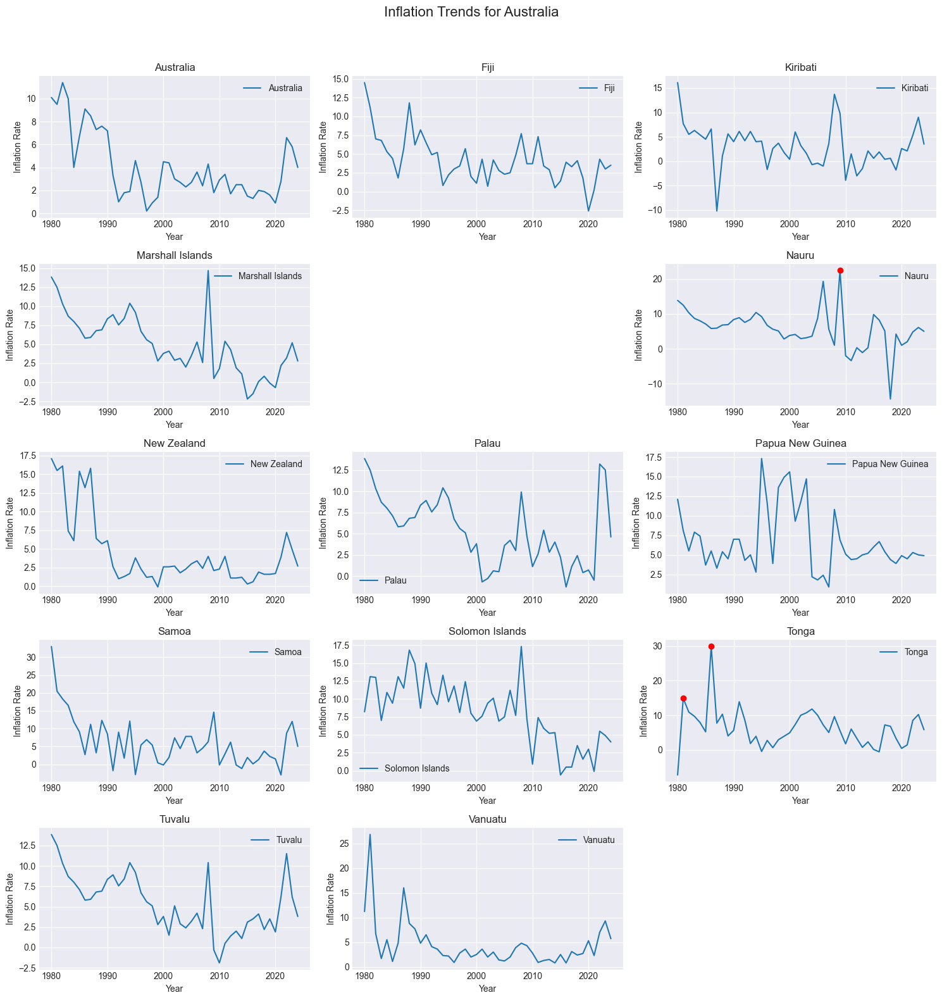

In [27]:
plot_continent_inflation_trends("Australia")

In [28]:
def plot_continent_inflation_bar(continent_name, year_start, year_end):
    countries = continents[continent_name]
    # Filter the dataframe for the selected countries
    continent_df = df[df['country_name'].isin(countries)]
    
    # Select the columns corresponding to the specified years
    selected_years = [str(year) for year in range(year_start, year_end + 1)]
    continent_df = continent_df[['country_name'] + selected_years]
    
    # Calculate the mean inflation over the selected years for each country
    continent_df['average_inflation'] = continent_df[selected_years].mean(axis=1)
    
    # Plot the bar plot
    plt.figure(figsize=(10, 6))
    plt.bar(continent_df['country_name'], continent_df['average_inflation'], color='skyblue')
    plt.xlabel("Country")
    plt.ylabel("Average Inflation (%)")
    plt.title(f"Average Inflation of Countries in {continent_name} ({year_start}-{year_end})")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

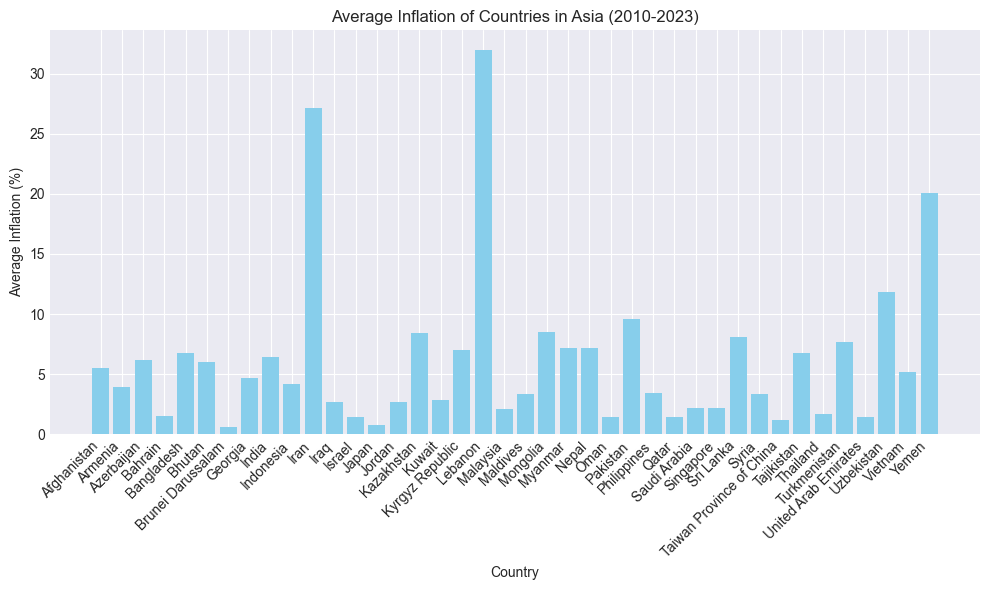

In [29]:
plot_continent_inflation_bar("Asia", 2010, 2023)

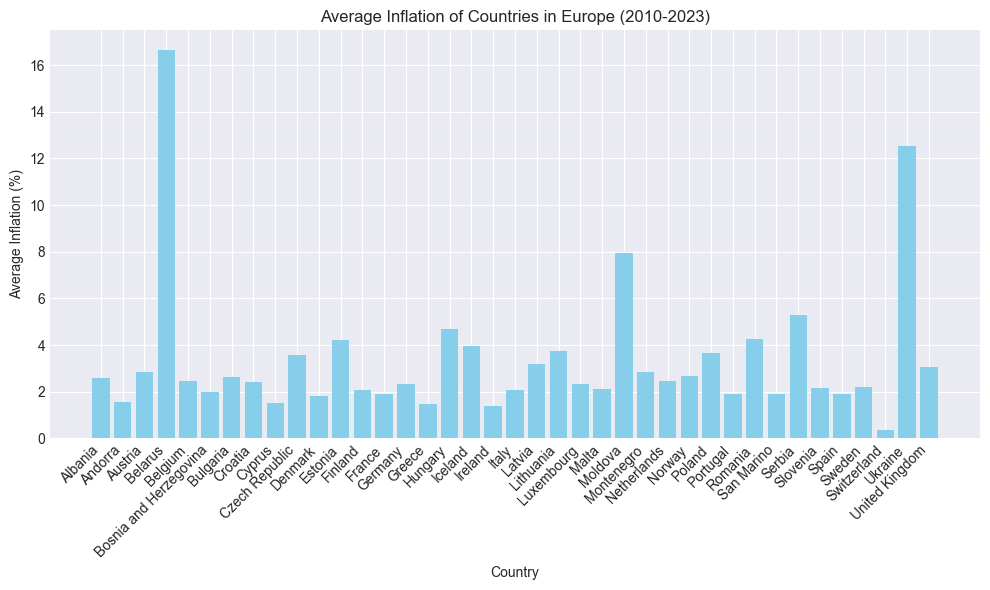

In [30]:
plot_continent_inflation_bar("Europe", 2010, 2023)

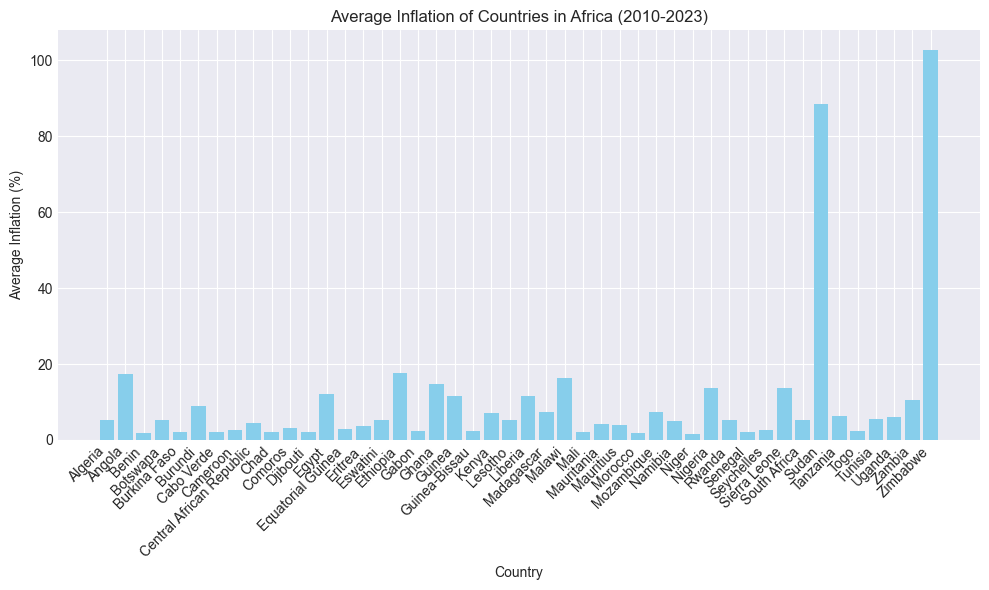

In [31]:
plot_continent_inflation_bar("Africa", 2010, 2023)

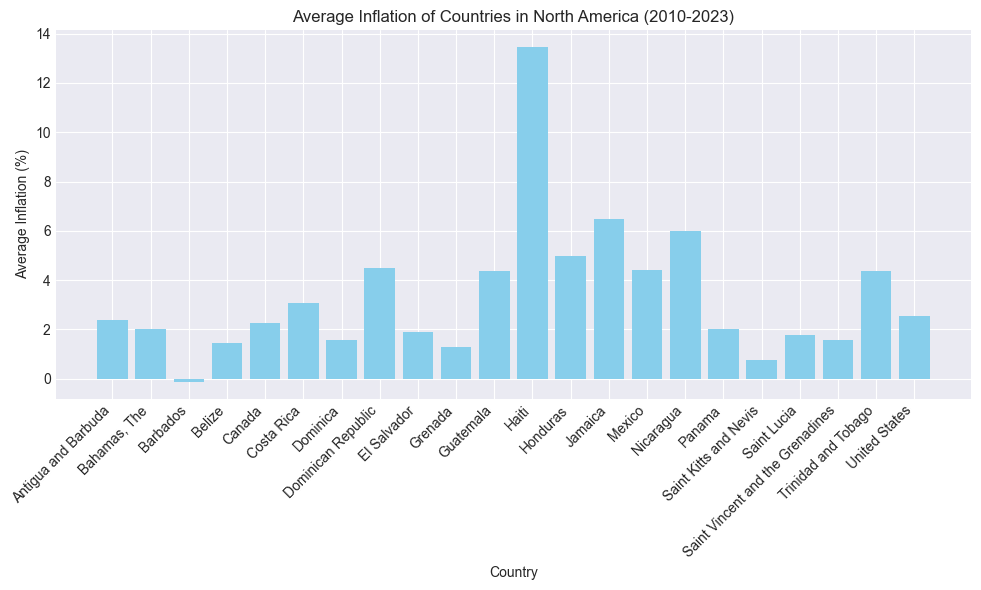

In [32]:
plot_continent_inflation_bar("North America", 2010, 2023)

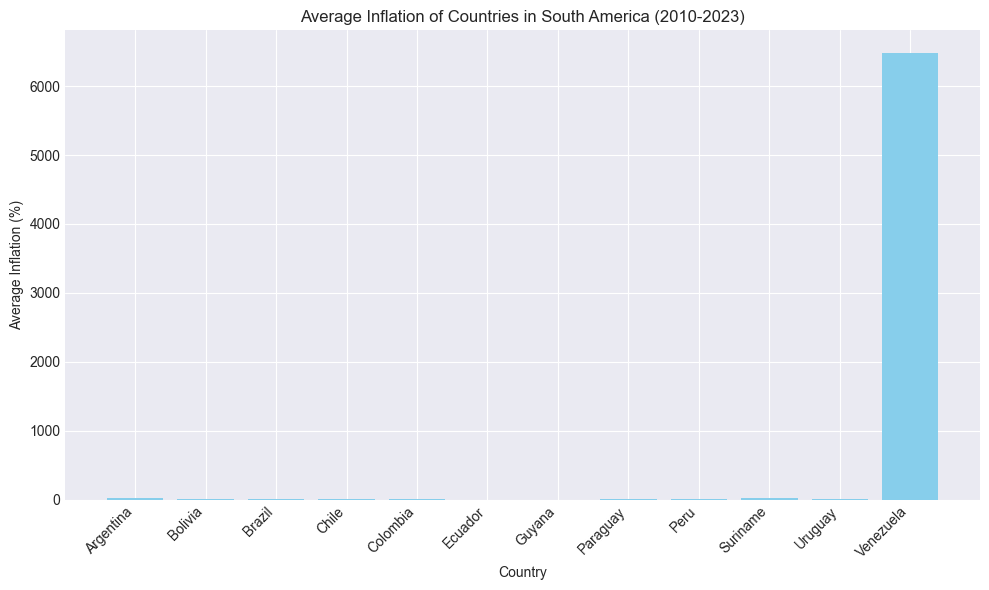

In [33]:
plot_continent_inflation_bar("South America", 2010, 2023)

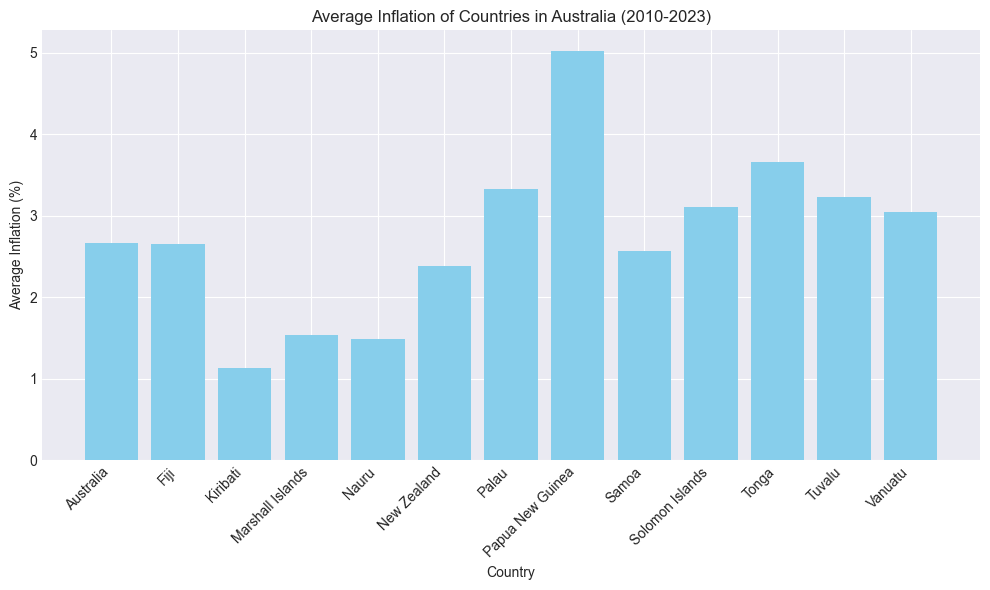

In [34]:
plot_continent_inflation_bar("Australia", 2010, 2023)

C:\Users\rahul\AppData\Local\Temp\ipykernel_10232\2509341098.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  country_inflation_df['average_inflation'] = country_inflation_df[selected_years].mean(axis=1)


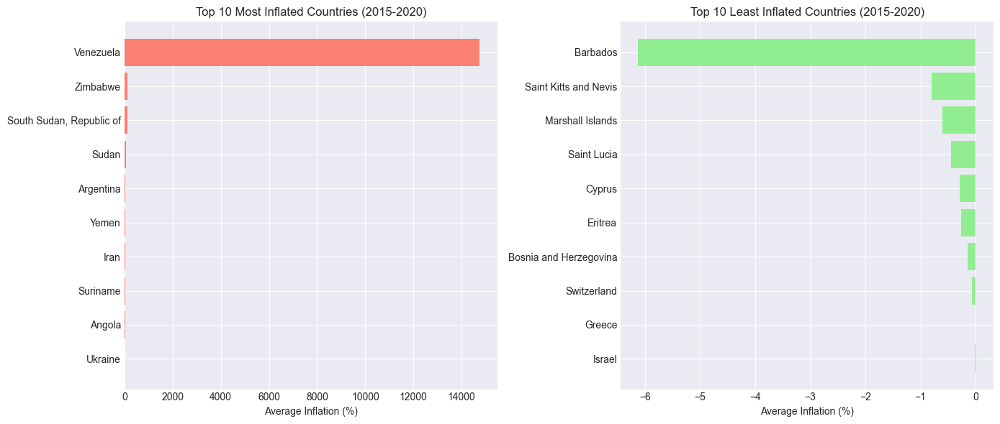

In [35]:
def plot_top_bottom_inflated_countries(year_start, year_end):
    # Select the columns corresponding to the specified years
    selected_years = [str(year) for year in range(year_start, year_end + 1)]
    country_inflation_df = df[['country_name'] + selected_years]
    
    # Calculate the mean inflation over the selected years for each country
    country_inflation_df['average_inflation'] = country_inflation_df[selected_years].mean(axis=1)
    
    # Sort the countries based on the average inflation rate
    most_inflated_countries = country_inflation_df.nlargest(10, 'average_inflation')
    least_inflated_countries = country_inflation_df.nsmallest(10, 'average_inflation')
    
    # Plotting
    plt.figure(figsize=(14, 6))

    # Top 10 most inflated countries
    plt.subplot(1, 2, 1)
    plt.barh(most_inflated_countries['country_name'], most_inflated_countries['average_inflation'], color='salmon')
    plt.xlabel("Average Inflation (%)")
    plt.title(f"Top 10 Most Inflated Countries ({year_start}-{year_end})")
    plt.gca().invert_yaxis()  # Invert y-axis for better readability

    # Top 10 least inflated countries
    plt.subplot(1, 2, 2)
    plt.barh(least_inflated_countries['country_name'], least_inflated_countries['average_inflation'], color='lightgreen')
    plt.xlabel("Average Inflation (%)")
    plt.title(f"Top 10 Least Inflated Countries ({year_start}-{year_end})")
    plt.gca().invert_yaxis()  # Invert y-axis for better readability

    plt.tight_layout()
    plt.show()

# Example: Find top 10 most and least inflated countries from 2015 to 2020
plot_top_bottom_inflated_countries(2015, 2020)

In [36]:
def plot_top_20_inflated_countries_percentage_change():
    # Determine the years to analyze
    most_recent_year = 2024  # Adjust this to the most recent year in your dataset
    starting_year = most_recent_year - 24

    # Select columns for the specified years and drop rows with NaN values
    df_years = df[['country_name', str(starting_year), str(most_recent_year)]].dropna()

    # Calculate percentage change in inflation for each country
    df_years['percentage_change'] = ((df_years[str(most_recent_year)] - df_years[str(starting_year)]) / df_years[str(starting_year)]) * 100

    # Handle cases where inflation was 0 in the starting year to avoid division by zero
    df_years.replace([float('inf'), -float('inf')], 0, inplace=True)
    
    # Sort countries by percentage change
    most_inflated_countries = df_years.nlargest(20, 'percentage_change')
    least_inflated_countries = df_years.nsmallest(20, 'percentage_change')

    # Plotting
    plt.figure(figsize=(14, 10))

    # Top 20 most inflated countries by percentage change
    plt.subplot(1, 2, 1)
    plt.barh(most_inflated_countries['country_name'], most_inflated_countries['percentage_change'], color='salmon')
    plt.xlabel("Percentage Change (%)")
    plt.title(f"Top 20 Most Increased Inflation Countries ({starting_year}-{most_recent_year})")
    plt.gca().invert_yaxis()  # Invert y-axis for better readability

    # Top 20 least inflated countries by percentage change
    plt.subplot(1, 2, 2)
    plt.barh(least_inflated_countries['country_name'], least_inflated_countries['percentage_change'], color='lightgreen')
    plt.xlabel("Percentage Change (%)")
    plt.title(f"Top 20 Most Decreased Inflation Countries ({starting_year}-{most_recent_year})")
    plt.gca().invert_yaxis()  # Invert y-axis for better readability

    plt.tight_layout()
    plt.show()


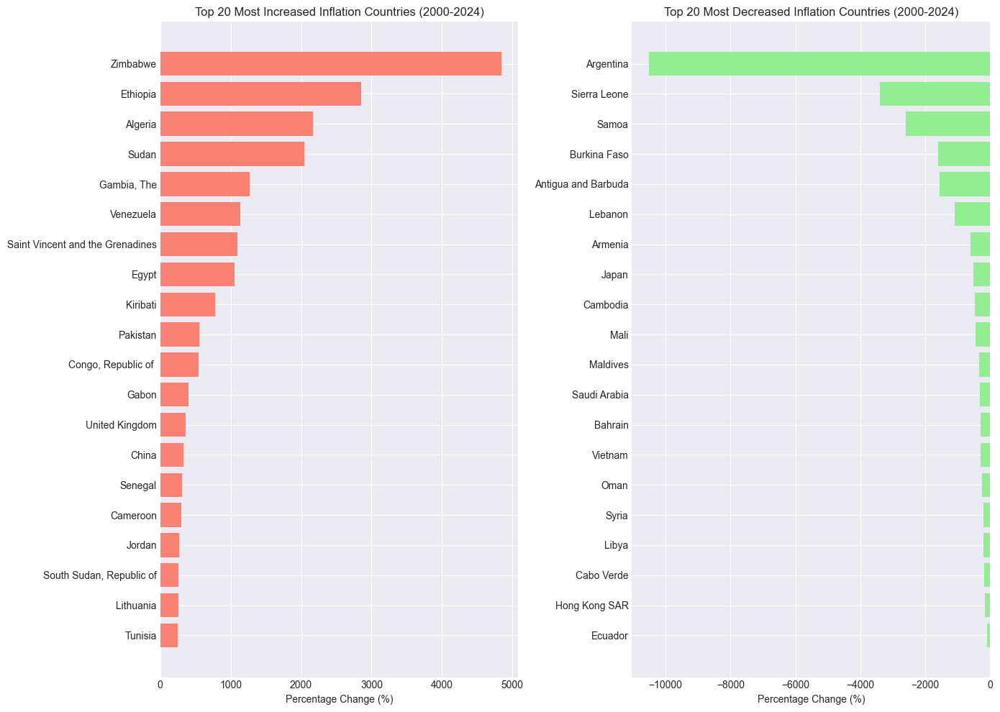

In [37]:

# Run the function to plot the top 20 inflation increase and decrease countries over the last 20 years
plot_top_20_inflated_countries_percentage_change()

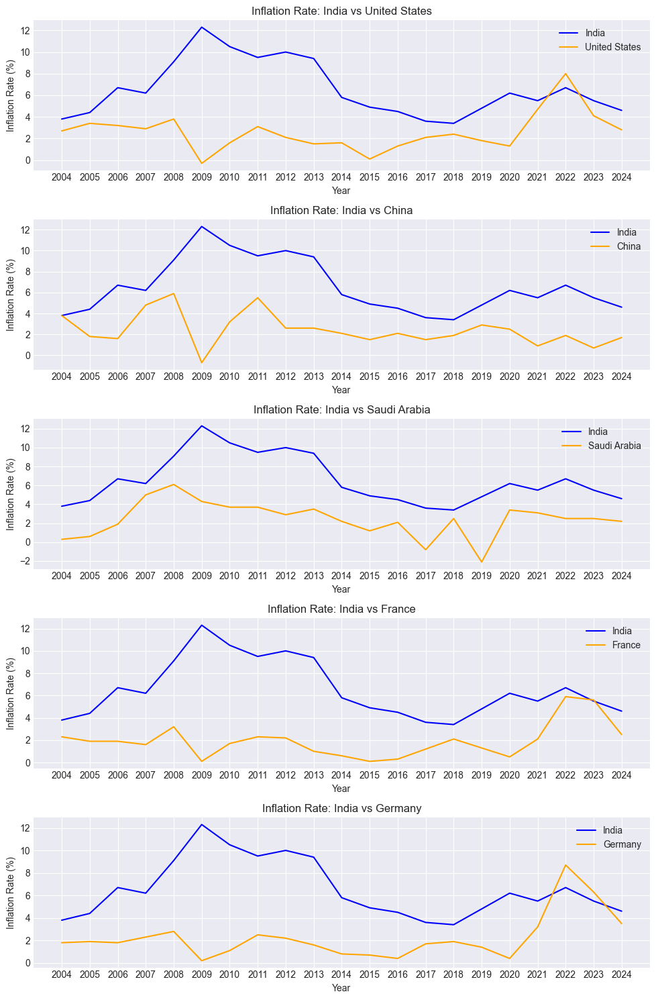

In [38]:
df_1 = df.set_index('country_name').drop(columns=['indicator_name'])

# Transpose the dataframe so that years become the index and countries are the columns
df_transposed = df_1.T

# Filter for the last 20 years (2004-2024)
df_filtered = df_transposed.loc['2004':'2024', ['India', 'United States', 'China', 'Saudi Arabia', 'France', 'Germany']]

# Plotting each country with respect to India in separate subplots
fig, axes = plt.subplots(5, 1, figsize=(10, 15))

for i, country in enumerate(['United States', 'China', 'Saudi Arabia', 'France', 'Germany']):
    axes[i].plot(df_filtered.index, df_filtered['India'], label='India', color='blue')
    axes[i].plot(df_filtered.index, df_filtered[country], label=country, color='orange')
    axes[i].set_title(f'Inflation Rate: India vs {country}')
    axes[i].set_xlabel('Year')
    axes[i].set_ylabel('Inflation Rate (%)')
    axes[i].legend()

plt.tight_layout()
plt.show()

In [39]:
high_inflation_countries = find_high_inflation_countries(df)
display_side_by_side(high_inflation_countries, ['Country', 'Years with Inflation > 100'])


Country,Years with Inflation > 100
Albania,[1992]
Angola,"[1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002]"
Argentina,[2023]
Armenia,"[1993, 1994, 1995]"
Azerbaijan,"[1993, 1994, 1995]"
Belarus,"[1992, 1993, 1994, 1995, 1999, 2000]"
Bolivia,"[1982, 1983, 1984, 1985, 1986]"
Brazil,"[1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994]"
Bulgaria,"[1991, 1996, 1997]"
Cambodia,"[1990, 1991, 1993]"


In [40]:
df.head()

,country_name,indicator_name,1980,1981,1982,1983,1984,1985,1986,1987,...,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,Afghanistan,Annual average inflation (consumer prices) rate,13.40,22.2,18.2,15.9,20.4,8.7,-2.1,18.4,...,-0.66,4.38,4.98,0.63,2.3,5.44,5.06,13.71,9.1,4.0
1,Albania,Annual average inflation (consumer prices) rate,13.85,12.5,10.3,8.7,8.0,7.1,5.8,5.9,...,1.90,1.30,2.00,2.00,1.4,1.60,2.00,6.70,4.8,4.0
2,Algeria,Annual average inflation (consumer prices) rate,9.70,14.6,6.6,7.8,6.3,10.4,14.0,5.9,...,4.80,6.40,5.60,4.30,2.0,2.40,7.20,9.30,9.0,6.8
3,Andorra,Annual average inflation (consumer prices) rate,13.85,12.5,10.3,8.7,8.0,7.1,5.8,5.9,...,-1.10,-0.40,2.60,1.00,0.5,0.10,1.70,6.20,5.2,3.5
4,Angola,Annual average inflation (consumer prices) rate,46.70,1.4,1.8,1.8,1.8,1.8,1.8,1.8,...,9.20,30.70,29.80,19.60,17.1,22.30,25.80,21.40,13.1,22.3


In [41]:
df_vis=df.copy()

In [42]:
df_vis.head()

,country_name,indicator_name,1980,1981,1982,1983,1984,1985,1986,1987,...,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,Afghanistan,Annual average inflation (consumer prices) rate,13.40,22.2,18.2,15.9,20.4,8.7,-2.1,18.4,...,-0.66,4.38,4.98,0.63,2.3,5.44,5.06,13.71,9.1,4.0
1,Albania,Annual average inflation (consumer prices) rate,13.85,12.5,10.3,8.7,8.0,7.1,5.8,5.9,...,1.90,1.30,2.00,2.00,1.4,1.60,2.00,6.70,4.8,4.0
2,Algeria,Annual average inflation (consumer prices) rate,9.70,14.6,6.6,7.8,6.3,10.4,14.0,5.9,...,4.80,6.40,5.60,4.30,2.0,2.40,7.20,9.30,9.0,6.8
3,Andorra,Annual average inflation (consumer prices) rate,13.85,12.5,10.3,8.7,8.0,7.1,5.8,5.9,...,-1.10,-0.40,2.60,1.00,0.5,0.10,1.70,6.20,5.2,3.5
4,Angola,Annual average inflation (consumer prices) rate,46.70,1.4,1.8,1.8,1.8,1.8,1.8,1.8,...,9.20,30.70,29.80,19.60,17.1,22.30,25.80,21.40,13.1,22.3


In [43]:
df_vis.drop(["indicator_name", "1980", "1981", "1982", "1983", "1984", "1985", "1986","1987", "1988", "1989", "1990", "1991", "1992", "1993"], axis=1, inplace=True)


In [44]:
df_vis.head()

,country_name,1994,1995,1996,1997,1998,1999,2000,2001,2002,...,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,Afghanistan,20.01,14.0,14.01,14.01,14.01,14.01,0.0,-43.4,51.93,...,-0.66,4.38,4.98,0.63,2.3,5.44,5.06,13.71,9.1,4.0
1,Albania,22.60,7.8,12.70,33.20,20.60,0.40,0.0,3.1,5.20,...,1.90,1.30,2.00,2.00,1.4,1.60,2.00,6.70,4.8,4.0
2,Algeria,29.00,29.8,18.70,5.70,5.00,2.60,0.3,4.2,1.40,...,4.80,6.40,5.60,4.30,2.0,2.40,7.20,9.30,9.0,6.8
3,Andorra,10.40,9.2,6.70,5.60,5.10,2.80,3.8,4.1,3.10,...,-1.10,-0.40,2.60,1.00,0.5,0.10,1.70,6.20,5.2,3.5
4,Angola,949.80,2672.2,4146.00,221.50,107.40,248.20,325.0,152.6,108.90,...,9.20,30.70,29.80,19.60,17.1,22.30,25.80,21.40,13.1,22.3


In [45]:
# Let's create a dataframe just for the United States's data
df_us = df_vis[df_vis['country_name'] == 'United States']
df_us.drop(["country_name"], axis=1, inplace=True)
df_us = df_us.T
df_us = df_us.reset_index()
df_us.rename(columns = {186:'United_States'}, inplace = True)
df_us.head()

C:\Users\rahul\AppData\Local\Temp\ipykernel_10232\2348856510.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_us.drop(["country_name"], axis=1, inplace=True)


,index,United_States
0,1994,2.6
1,1995,2.8
2,1996,2.9
3,1997,2.3
4,1998,1.5


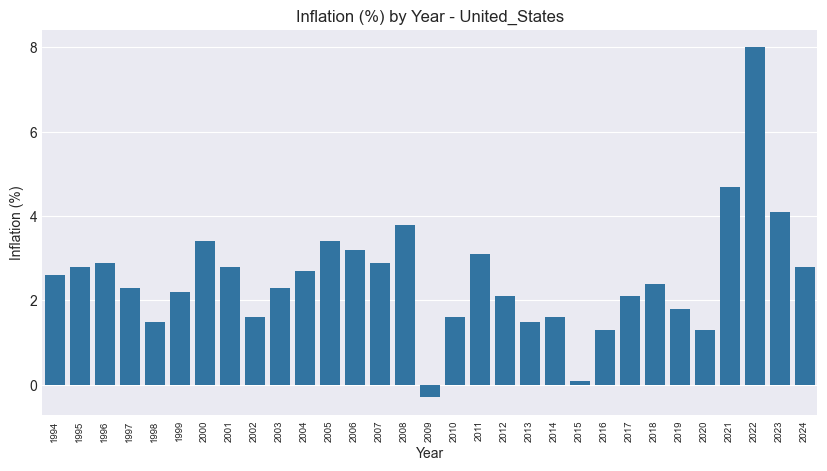

In [46]:
fig, ax = plt.subplots(figsize=(10, 5))
ax = sns.barplot(x = "index", y = "United_States", data = df_us)
plt.title("Inflation (%) by Year - United_States", fontsize = 12)
plt.xticks(rotation=90, fontsize = 7)
ax.set_xlabel("Year")
ax.set_ylabel("Inflation (%)")

plt.show()

In [47]:
# Let's create a dataframe just for the India's data

df_in = df_vis[df_vis['country_name'] == 'India']
df_in.drop(["country_name"], axis=1, inplace=True)
df_in = df_in.T
df_in = df_in.reset_index()
df_in.rename(columns = {77:'India'}, inplace = True)
df_in.head()

C:\Users\rahul\AppData\Local\Temp\ipykernel_10232\2005827749.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_in.drop(["country_name"], axis=1, inplace=True)


,index,India
0,1994,10.3
1,1995,10.0
2,1996,9.4
3,1997,6.8
4,1998,13.1


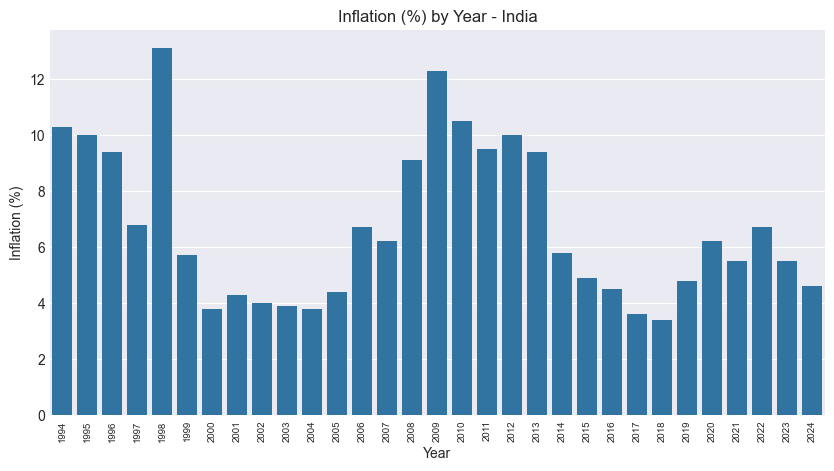

In [48]:
# create bar plot Inflation (%) by Year - India

fig, ax = plt.subplots(figsize=(10, 5))
ax = sns.barplot(x = "index", y = "India", data = df_in)
plt.title("Inflation (%) by Year - India", fontsize = 12)
plt.xticks(rotation=90, fontsize = 7)
ax.set_xlabel("Year")
ax.set_ylabel("Inflation (%)")

plt.show()

In [51]:
# Creating a dataframe for Brazil and United States
df_2 = df_vis.loc[df_vis['country_name'].isin(['India', 'United States'])]

# New column to be added for 1993 with initial values equal to zero.
new_col = [0, 0] 
  
# Inserting the column  1993 at the beginning in the DataFrame. 
df_2.insert(loc = 0,
          column = '1993',
          value = new_col)

# Placing the country_name column as index and transposing the dataframe
df_2 = df_2.set_index('country_name').T

# Dividing the inflation columns by 100 to convert the values to percentages.
df_2['India'] = df_2['India'] / 100
df_2['United States'] = df_2['United States'] / 100

# Creating columns for both countries accumulating inflations using cumprod()
df_2['India_accum'] = (1 + df_2['India']).cumprod()
df_2['US_accum'] = (1 + df_2['United States']).cumprod()

# Creating columns for both countries with the devaluation of their respective currencies
df_2['Rupee(Rs)'] = 1 / df_2['India_accum']
df_2['Dollar(U$)'] = 1 / df_2['US_accum']

# Creating a column with the correlations between the two currencies devalued by inflation
df_2['Dollar/Rupee'] = df_2['Dollar(U$)'] / df_2['Rupee(Rs)']

# Returning the index to a dataframe column
df_2['Year'] = df_2.index

df_2


country_name,India,United States,India_accum,US_accum,Rupee(Rs),Dollar(U$),Dollar/Rupee,Year
1993,0.000,0.000,1.000000,1.000000,1.000000,1.000000,1.000000,1993
1994,0.103,0.026,1.103000,1.026000,0.906618,0.974659,1.075049,1994
1995,0.100,0.028,1.213300,1.054728,0.824198,0.948112,1.150344,1995
1996,0.094,0.029,1.327350,1.085315,0.753381,0.921391,1.223009,1996
1997,0.068,0.023,1.417610,1.110277,0.705413,0.900676,1.276807,1997
1998,0.131,0.015,1.603317,1.126932,0.623707,0.887365,1.422728,1998
1999,0.057,0.022,1.694706,1.151724,0.590073,0.868264,1.471451,1999
2000,0.038,0.034,1.759105,1.190883,0.568471,0.839713,1.477144,2000
2001,0.043,0.028,1.834746,1.224227,0.545034,0.816842,1.498697,2001
2002,0.040,0.016,1.908136,1.243815,0.524072,0.803978,1.534100,2002


In [52]:
# Converting column Year to numeric.
df_2["Year"] = pd.to_numeric(df_2["Year"])

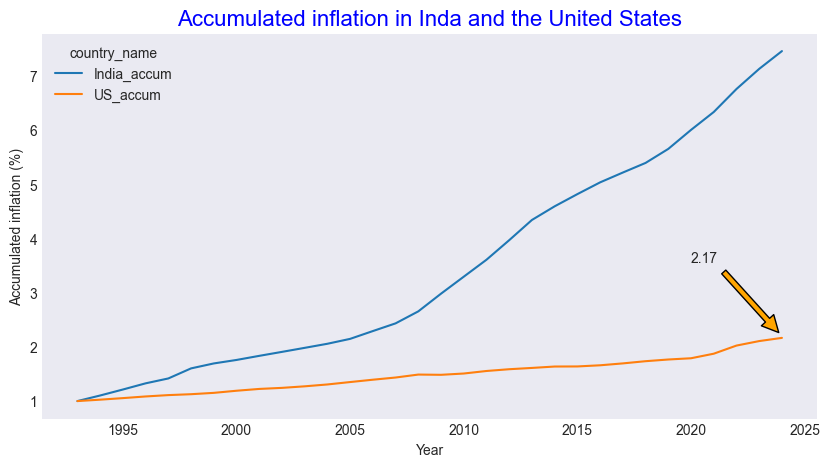

In [60]:
# Accumulated inflation in Brazil and the United States
# Period: from 1994 to 2024

df_2.plot(x="Year", y=['India_accum', 'US_accum'],
              kind="line", figsize=(10, 5))
plt.title("Accumulated inflation in Inda and the United States", fontsize = 16, color = 'blue')
plt.annotate('7.45',
      horizontalalignment = 'left',
      verticalalignment = 'bottom',
      xytext = (2019, 12),
      xy = (2024, 12),
      arrowprops = dict(facecolor = 'blue', shrink = 0.05))
plt.annotate('2.17',
      horizontalalignment = 'left',
      verticalalignment = 'bottom',
      xytext = (2020, 3.5),
      xy = (2024, 2.2),
      arrowprops = dict(facecolor = 'orange', shrink = 0.05))
plt.ylabel('Accumulated inflation (%)', rotation=90, fontsize = 10)
plt.grid()
plt.show()

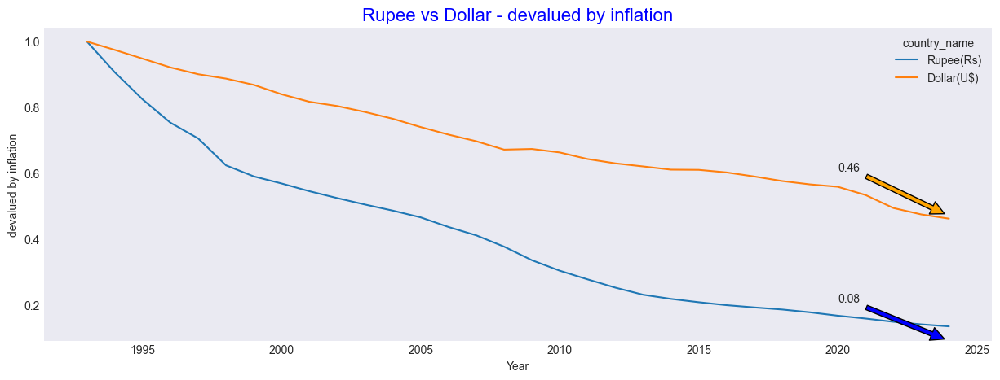

In [62]:
# Real vs Dollar - devalued by inflation
# Period: from 1994 to 2024

df_2.plot(x="Year", y=['Rupee(Rs)', 'Dollar(U$)'],
              kind="line", figsize=(15, 5))
plt.title("Rupee vs Dollar - devalued by inflation", fontsize = 16, color = 'blue')
#plt.xticks(np.arange(07_1994, 2024, 5), rotation=45)
plt.ylabel('devalued by inflation', rotation=90, fontsize = 10)
plt.annotate('0.08',
      horizontalalignment = 'left',
      verticalalignment = 'bottom',
      xytext = (2020, 0.2),
      xy = (2024, 0.09),
      arrowprops = dict(facecolor = 'blue', shrink = 0.05))
plt.annotate('0.46',
      horizontalalignment = 'left',
      verticalalignment = 'bottom',
      xytext = (2020, 0.6),
      xy = (2024, 0.47),
      arrowprops = dict(facecolor = 'orange', shrink = 0.05))
plt.grid()
plt.show()

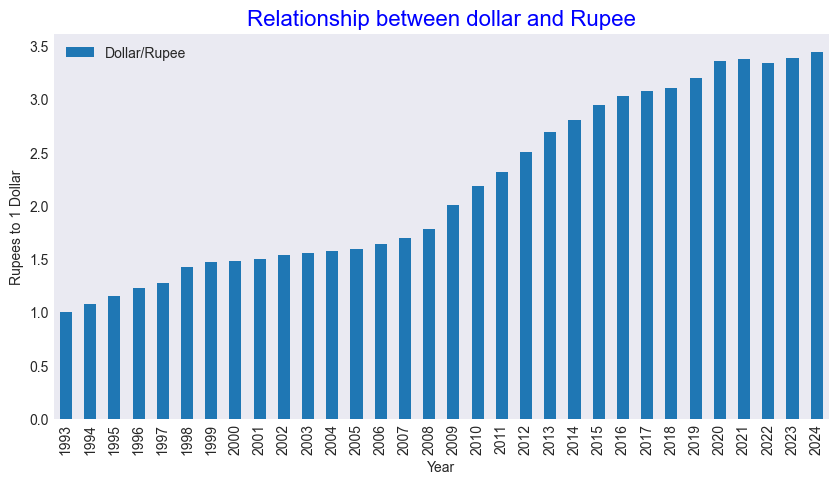

In [63]:
# Relationship between dollar and Real
# Period: from 1994 to 2024

df_2.plot(x="Year", y='Dollar/Rupee',
         kind="bar", figsize=(10, 5))
plt.title("Relationship between dollar and Rupee", fontsize = 16, color = 'blue')
plt.ylabel('Rupees to 1 Dollar', rotation=90, fontsize = 10)
plt.grid()
plt.show()

In [243]:
# Checking for missing values
missing_values = df.isnull().sum()
print("Missing Values in Each Column:")
print(missing_values[missing_values > 0])

Missing Values in Each Column:
Series([], dtype: int64)


In [244]:
# Initialize a list to collect insights as we proceed with analysis
insights = []

# Example insight based on initial data check
if missing_values.sum() > 0:
    insights.append("The dataset contains missing values, especially for certain countries and years, which may impact analysis accuracy.")

# Example insight based on trend visualization
insights.append("Initial trend analysis shows varying inflation rates across sample countries, with some experiencing high volatility over the years.")

# Print current insights
print("\nCurrent Insights:")
for i, insight in enumerate(insights, 1):
    print(f"{i}. {insight}")



Current Insights:
1. Initial trend analysis shows varying inflation rates across sample countries, with some experiencing high volatility over the years.


In [245]:
# Set up features (X) and target (y) for the years 2000 to 2023
df = df.dropna(subset=[str(year) for year in range(2000, 2024)])  # Drop rows with missing values in this range
X = df.loc[:, '2000':'2023'].values  # Use 2000-2023 as features
y = df['2024'].values  # Predict inflation for 2024

In [246]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [247]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [248]:
models = {
    "Linear Regression": LinearRegression(),
    "Decision Tree": DecisionTreeRegressor(random_state=42),
    "Random Forest": RandomForestRegressor(random_state=42, n_estimators=100),
    "Support Vector Machine (SVR)": SVR(),
    "Gradient Boosting": GradientBoostingRegressor(random_state=42)
}

In [249]:
metrics = {}

# Function to evaluate the model
def evaluate_model(y_true, y_pred, model_name):
    mse = mean_squared_error(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    rmse = math.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    
    # Store metrics in the dictionary
    metrics[model_name] = {
        "MSE": mse,
        "MAE": mae,
        "RMSE": rmse,
        "R2 Score": r2
    }


In [250]:
for model_name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    evaluate_model(y_test, y_pred, model_name)

In [251]:
for model_name, metric in metrics.items():
    print(f"Model: {model_name}")
    for metric_name, value in metric.items():
        print(f"{metric_name}: {value}")
    print("\n")

Model: Linear Regression
MSE: 26.974638282599905
MAE: 2.5666212460446483
RMSE: 5.193711416954152
R2 Score: -0.14061314466344865


Model: Decision Tree
MSE: 167.17900000000003
MAE: 3.5150000000000006
RMSE: 12.929771846401623
R2 Score: -6.069105539579888


Model: Random Forest
MSE: 49.81148844999996
MAE: 2.7069999999999994
RMSE: 7.057725444504055
R2 Score: -1.1062613661800484


Model: Support Vector Machine (SVR)
MSE: 16.67182386572886
MAE: 1.8088860337080503
RMSE: 4.083114481095143
R2 Score: 0.29503775926328024


Model: Gradient Boosting
MSE: 42.23817761180799
MAE: 2.5700654909863627
RMSE: 6.499090521896736
R2 Score: -0.7860265663593575




In [253]:
param_grid = {
    'C': [0.1, 1, 10, 100],
    'epsilon': [0.1, 0.2, 0.5, 1],
    'kernel': ['linear', 'poly', 'rbf']
}


In [254]:
svr = SVR()


In [258]:
grid_search = GridSearchCV(svr, param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=SVR(), n_jobs=-1,
             param_grid={'C': [0.1, 1, 10, 100], 'epsilon': [0.1, 0.2, 0.5, 1],
                         'kernel': ['linear', 'poly', 'rbf']},
             scoring='neg_mean_squared_error')

In [259]:
best_svr = grid_search.best_estimator_

print("Best parameters:", grid_search.best_params_)

Best parameters: {'C': 1, 'epsilon': 0.5, 'kernel': 'linear'}


In [261]:
y_pred = best_svr.predict(X_test)

In [262]:
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print("Optimized SVR Performance:")
print("MSE:", mse)
print("MAE:", mae)
print("RMSE:", rmse)
print("R² Score:", r2)

Optimized SVR Performance:
MSE: 16.317939563664744
MAE: 2.0701927295421774
RMSE: 4.039546950298355
R² Score: 0.310001633195364


In [264]:
cv_mse = cross_val_score(best_svr, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
cv_mae = cross_val_score(best_svr, X_train, y_train, cv=5, scoring='neg_mean_absolute_error')
cv_r2 = cross_val_score(best_svr, X_train, y_train, cv=5, scoring='r2')

print("\nCross-Validated Performance Metrics:")
print("Mean MSE:", -cv_mse.mean())
print("Mean MAE:", -cv_mae.mean())
print("Mean R² Score:", cv_r2.mean())


Cross-Validated Performance Metrics:
Mean MSE: 197.73042914906355
Mean MAE: 4.21367043823868
Mean R² Score: 0.42504056959487035
